
Processing Folder: Screws
Image: img1.jpg | Final Count: 56 | Watershed: 168, Contour: 56, Blob: 38


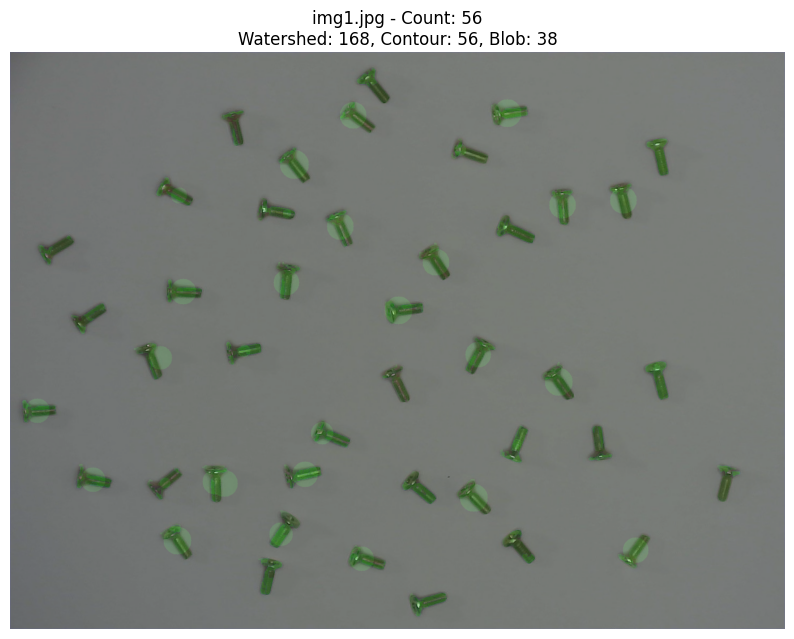

Image: img2.jpg | Final Count: 58 | Watershed: 178, Contour: 58, Blob: 35


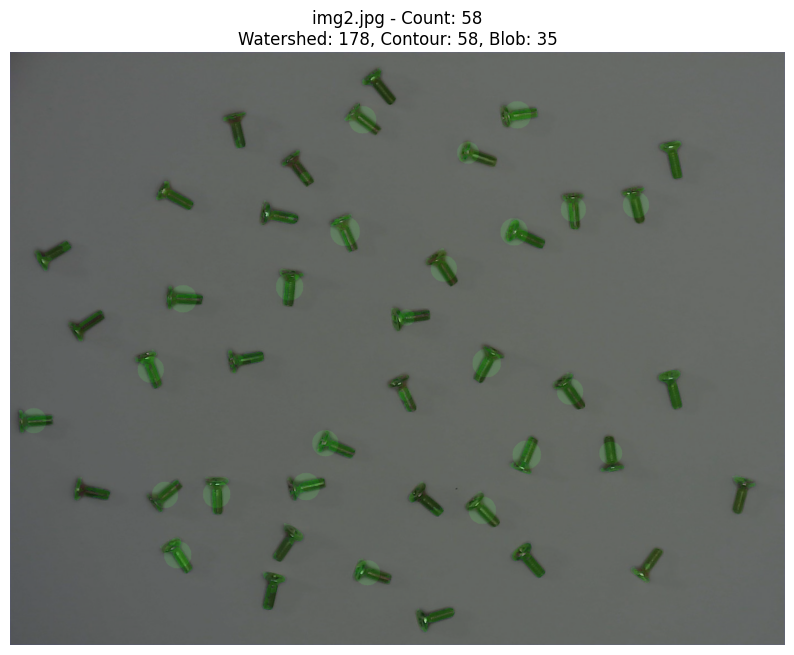

Image: img3.jpg | Final Count: 53 | Watershed: 167, Contour: 53, Blob: 37


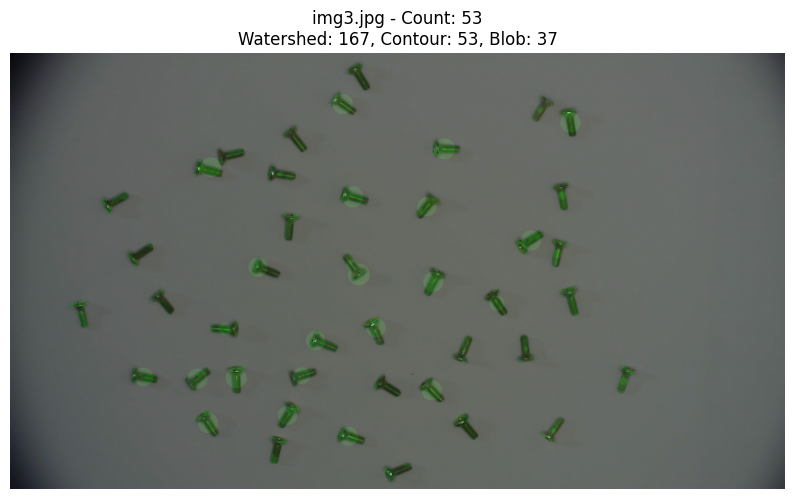

Image: img4.jpg | Final Count: 59 | Watershed: 181, Contour: 59, Blob: 26


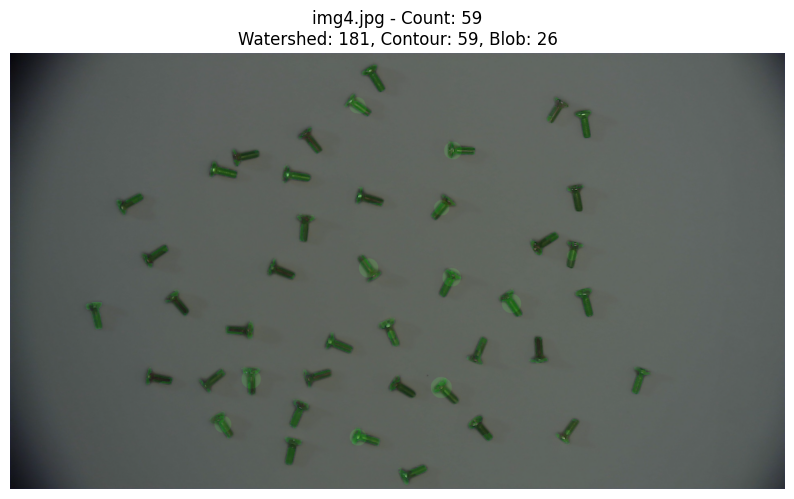

Image: img5.jpg | Final Count: 52 | Watershed: 52, Contour: 54, Blob: 44


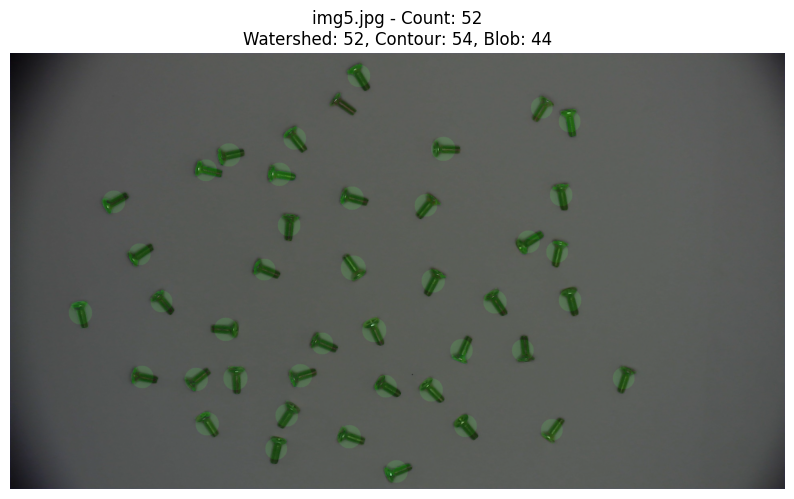

Image: img6.jpg | Final Count: 60 | Watershed: 157, Contour: 60, Blob: 29


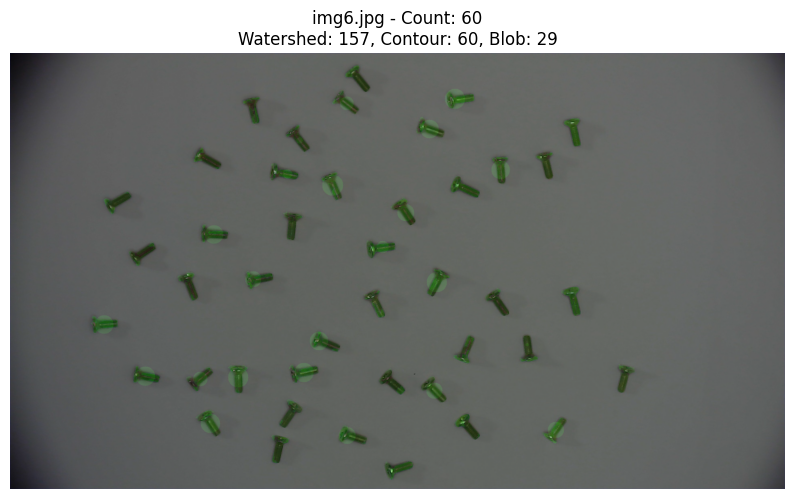

Image: img7.jpg | Final Count: 54 | Watershed: 165, Contour: 54, Blob: 38


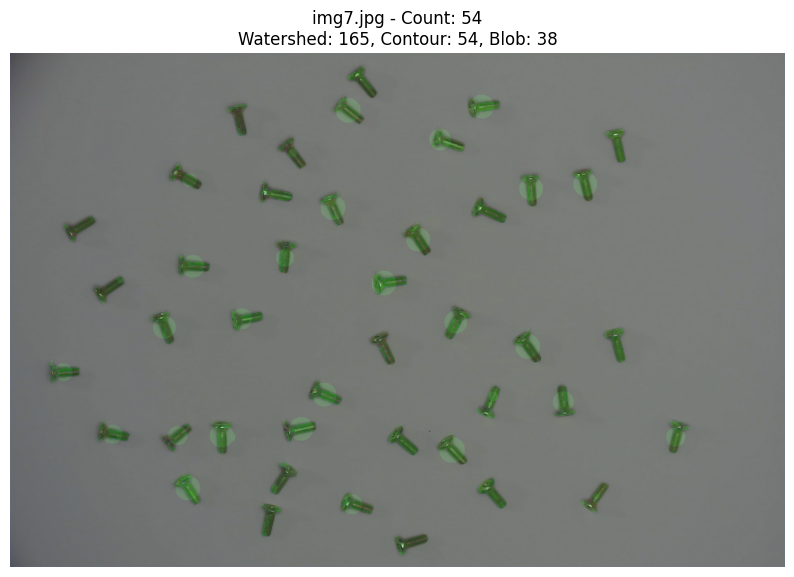


Processing Folder: ScrewAndBolt
Image: 20240713_192951.jpg | Final Count: 301 | Watershed: 301, Contour: 631, Blob: 40


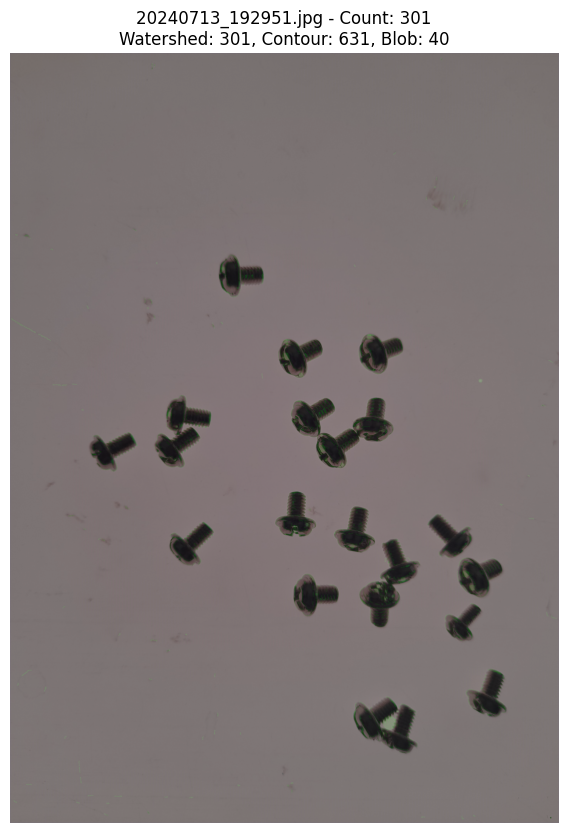

Image: 20240713_193135.jpg | Final Count: 494 | Watershed: 494, Contour: 637, Blob: 46


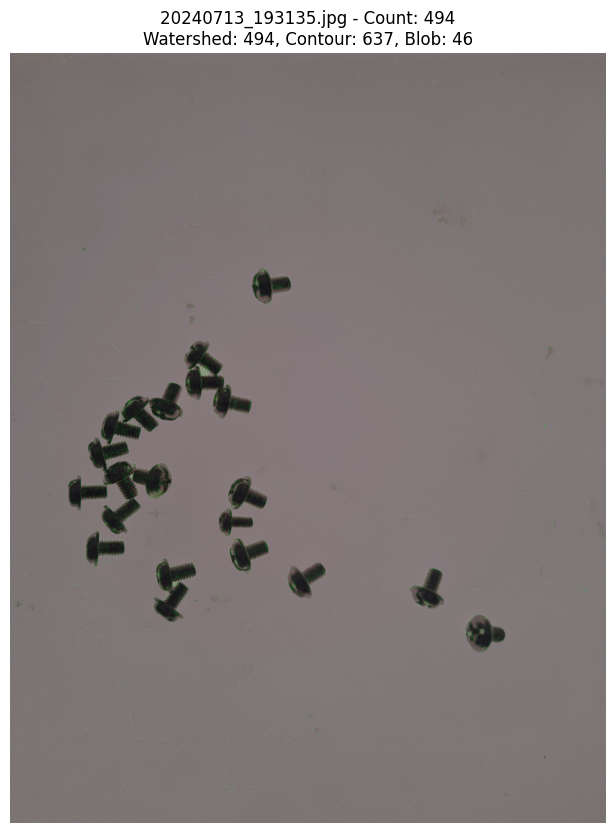

Image: 20240713_193650.jpg | Final Count: 82 | Watershed: 145, Contour: 82, Blob: 2


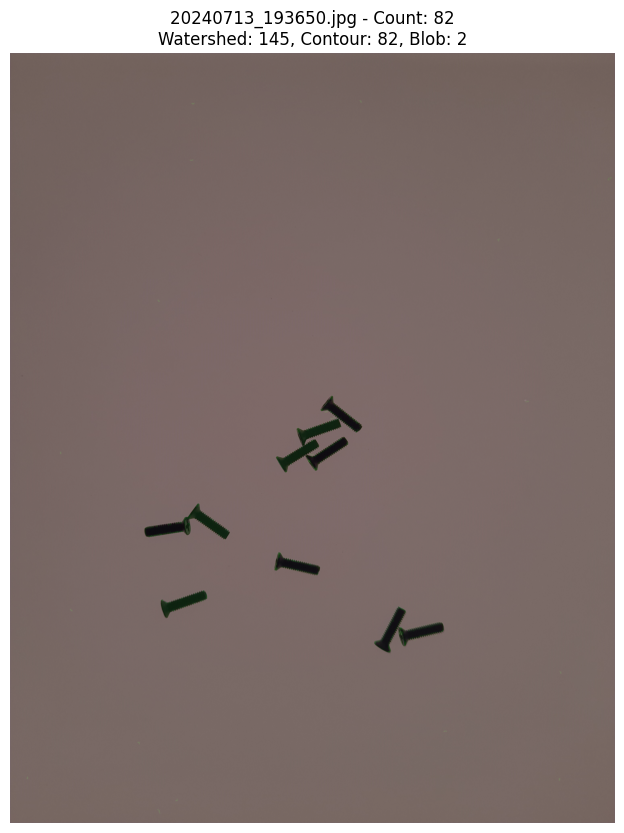

Image: 20240713_193659.jpg | Final Count: 75 | Watershed: 258, Contour: 75, Blob: 6


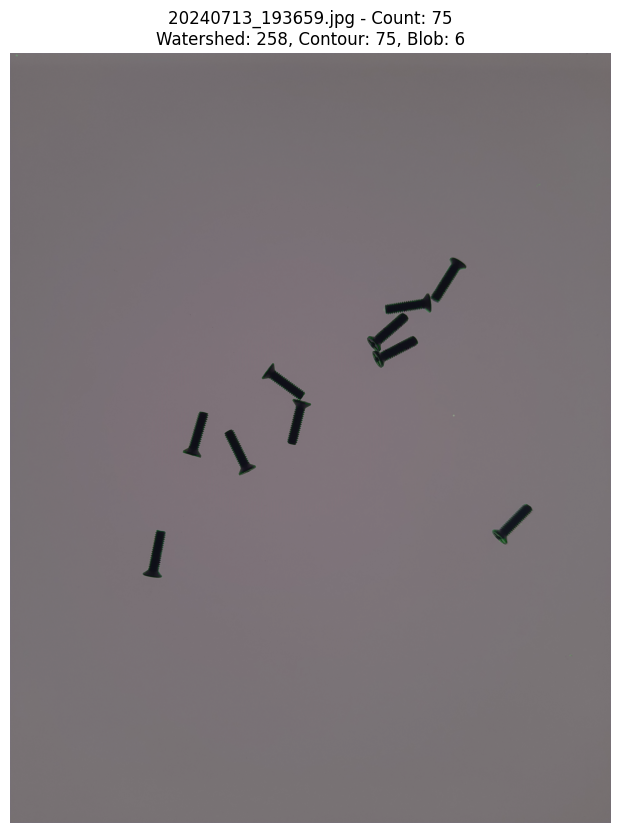

Image: 20240713_193831.jpg | Final Count: 952 | Watershed: 1132, Contour: 952, Blob: 88


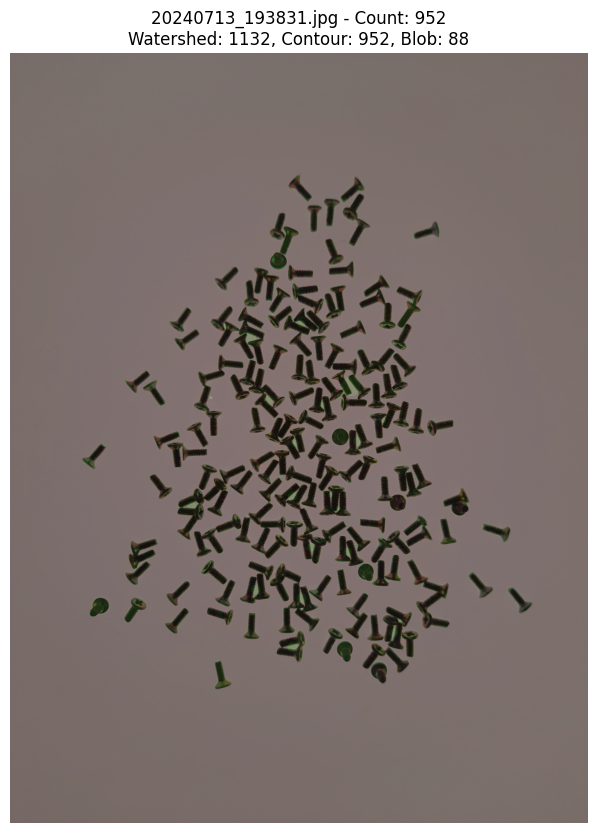

Image: 20240713_193839.jpg | Final Count: 799 | Watershed: 1554, Contour: 799, Blob: 81


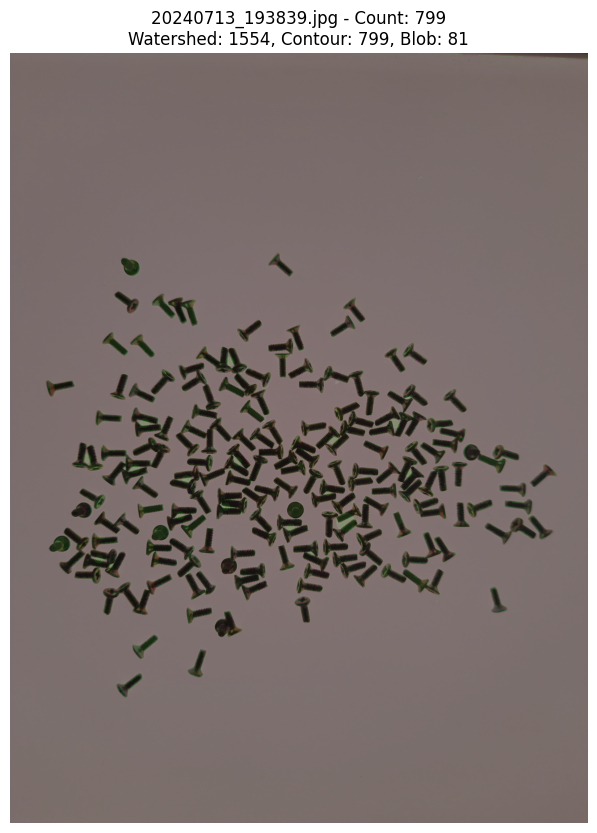

Image: 20240713_193907.jpg | Final Count: 410 | Watershed: 1606, Contour: 410, Blob: 63


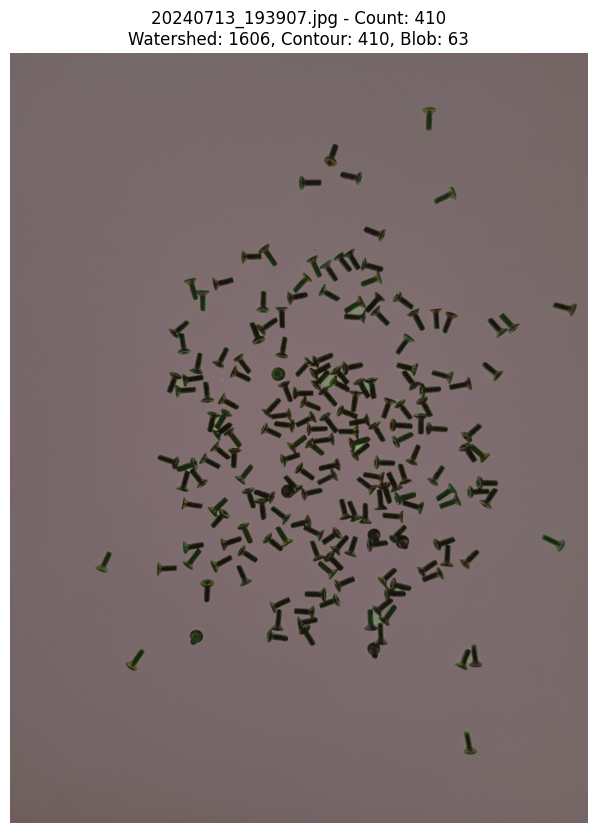

Image: 20240713_194200.jpg | Final Count: 234 | Watershed: 1015, Contour: 234, Blob: 16


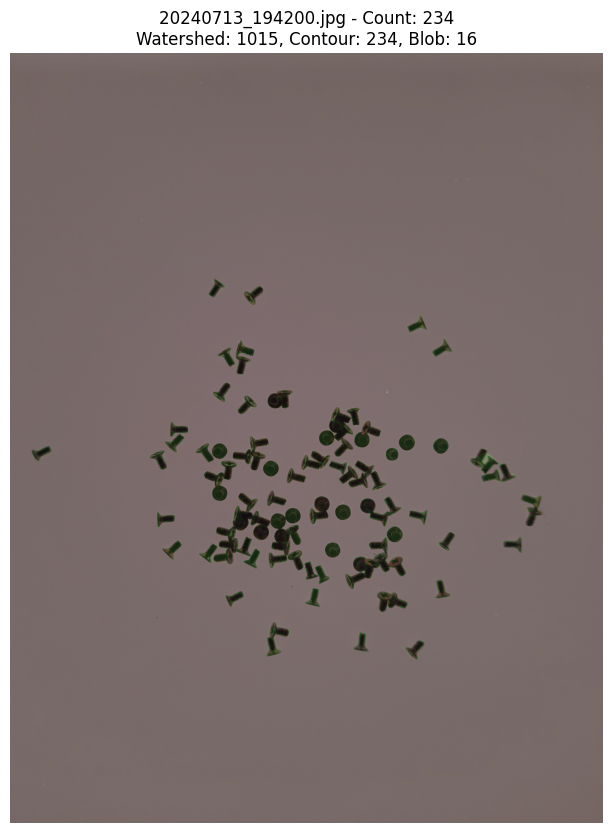

Image: 20240713_194206.jpg | Final Count: 222 | Watershed: 422, Contour: 222, Blob: 40


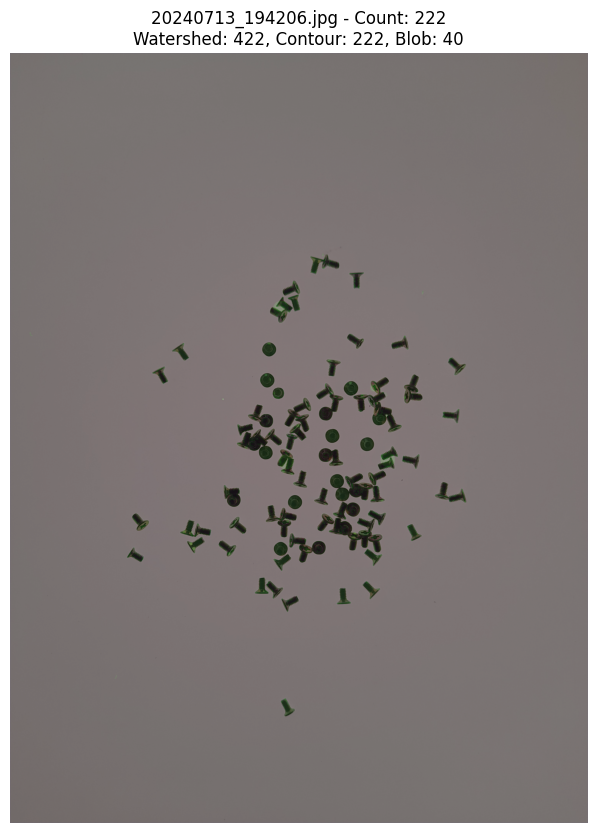

Image: 20240713_194215.jpg | Final Count: 217 | Watershed: 724, Contour: 217, Blob: 12


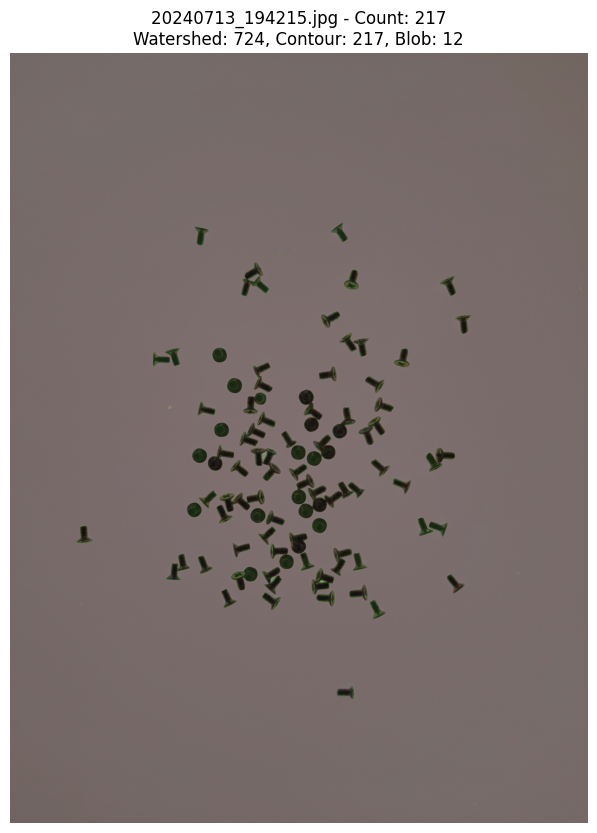

Image: 20240713_194232.jpg | Final Count: 201 | Watershed: 517, Contour: 201, Blob: 18


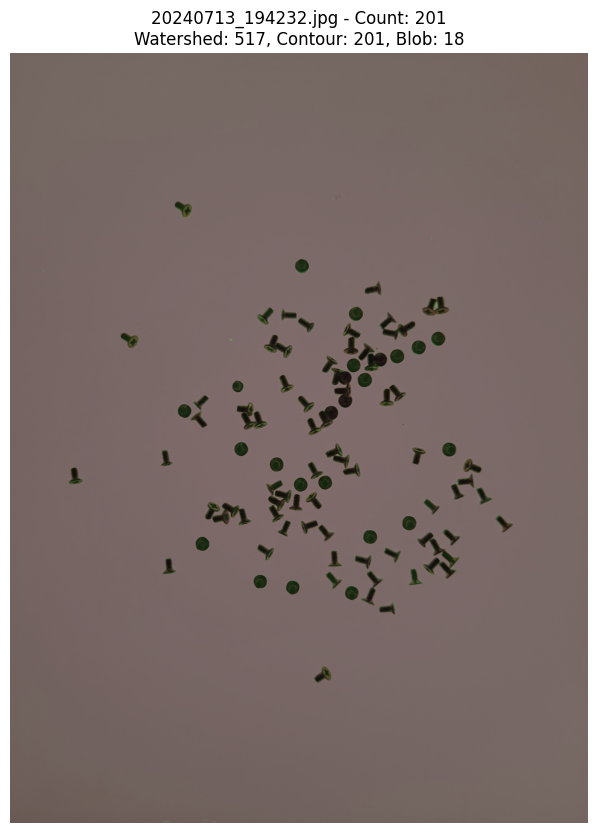

Image: 20240713_194256.jpg | Final Count: 150 | Watershed: 508, Contour: 150, Blob: 27


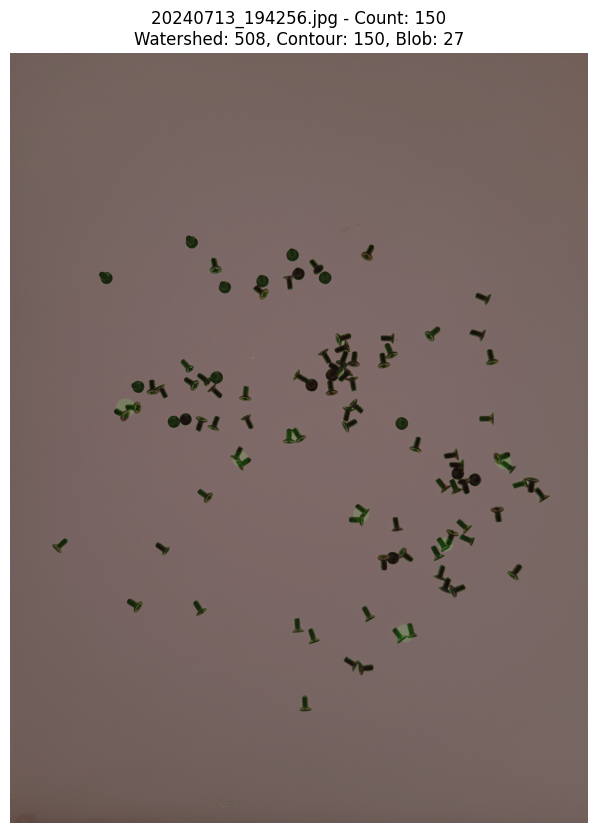

Image: 20240713_194316.jpg | Final Count: 162 | Watershed: 574, Contour: 162, Blob: 21


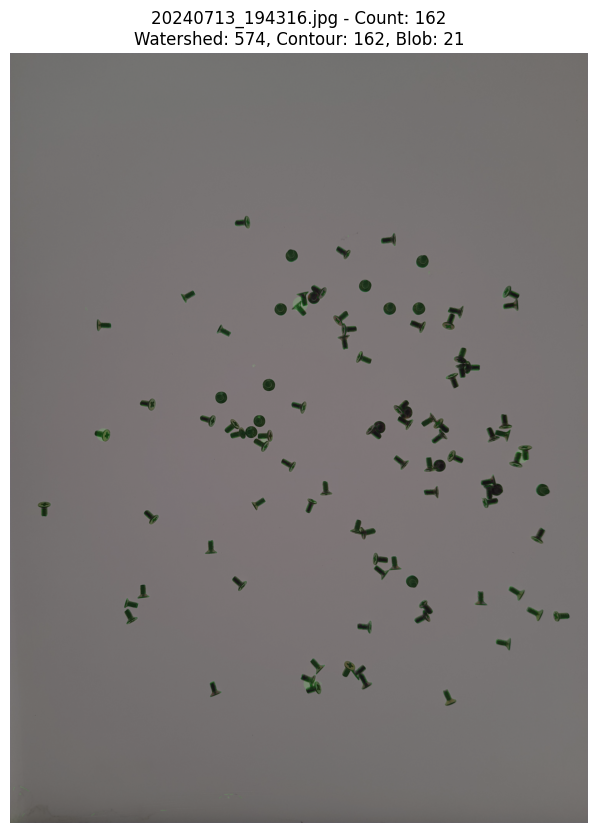

Image: 20240713_194541.jpg | Final Count: 782 | Watershed: 2138, Contour: 782, Blob: 484


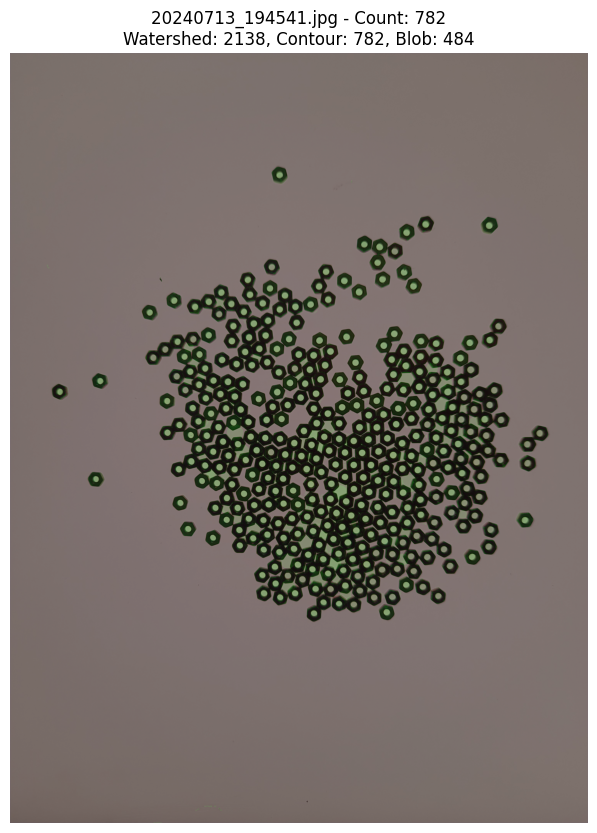

Image: 20240713_194551.jpg | Final Count: 763 | Watershed: 2296, Contour: 763, Blob: 507


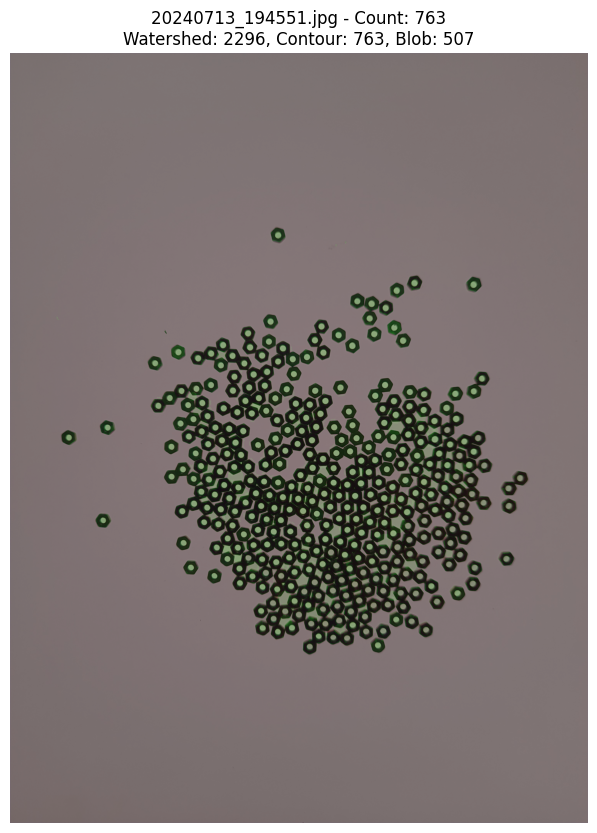

Image: 20240713_194606.jpg | Final Count: 654 | Watershed: 1819, Contour: 654, Blob: 415


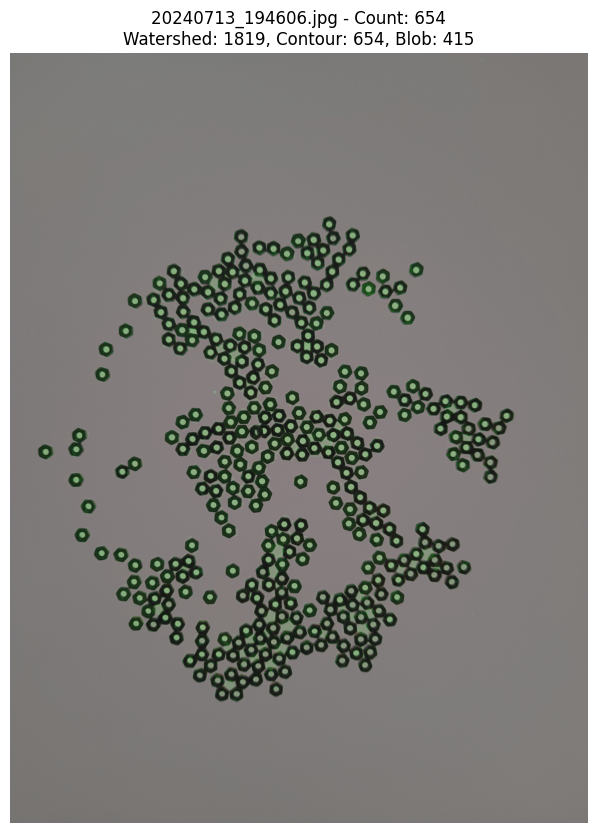

Image: 20240713_194621.jpg | Final Count: 601 | Watershed: 1101, Contour: 601, Blob: 380


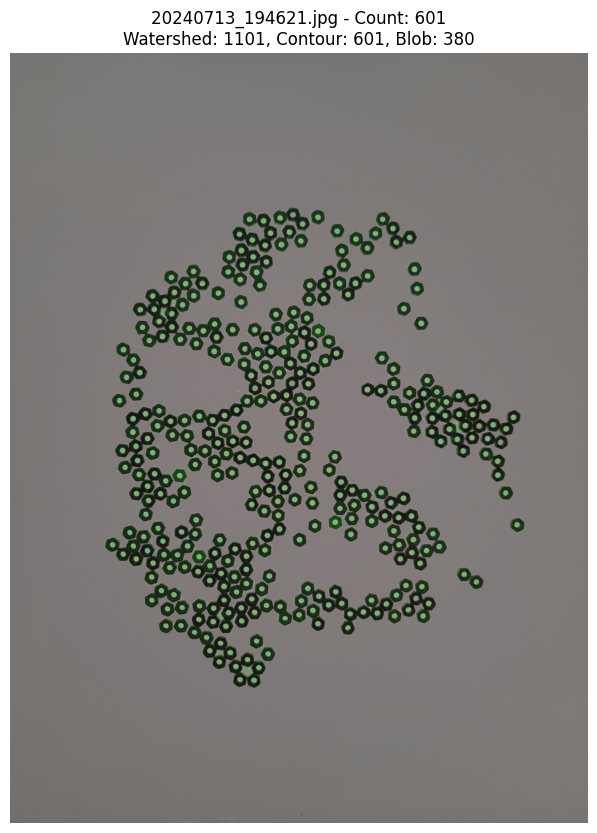

Image: 20240713_194630.jpg | Final Count: 607 | Watershed: 1439, Contour: 607, Blob: 370


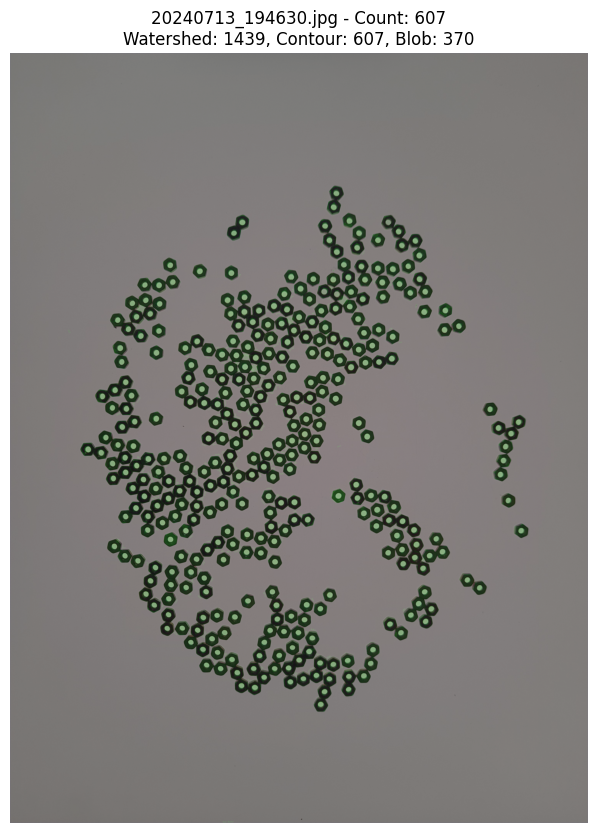


No ground truth data available to calculate accuracy


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import json

# Function to count objects and draw masks with multiple methods
def count_and_mask(image_path, ground_truth=None):
    # Read image
    img = cv2.imread(image_path)
    original = img.copy()
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    height, width = img_gray.shape
    
    # Method 1: Enhanced Watershed
    def watershed_method():
        # Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        enhanced = clahe.apply(img_gray)
        
        # Bilateral filter to preserve edges while removing noise
        bilateral = cv2.bilateralFilter(enhanced, 9, 75, 75)
        
        # Adaptive thresholding
        thresh = cv2.adaptiveThreshold(bilateral, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                      cv2.THRESH_BINARY_INV, 11, 2)
        
        # Morphological operations
        kernel = np.ones((3,3), np.uint8)
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
        
        # Sure background
        sure_bg = cv2.dilate(opening, kernel, iterations=3)
        
        # Sure foreground
        dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
        _, sure_fg = cv2.threshold(dist_transform, 0.6*dist_transform.max(), 255, 0)
        
        # Unknown region
        sure_fg = np.uint8(sure_fg)
        unknown = cv2.subtract(sure_bg, sure_fg)
        
        # Marker labelling
        num_labels, markers = cv2.connectedComponents(sure_fg)
        
        # Add 1 to all labels so that sure background is not 0
        markers = markers + 1
        markers[unknown == 255] = 0
        
        # Apply watershed
        markers = cv2.watershed(img, markers)
        
        # Create mask image
        mask = np.zeros_like(img)
        for i in range(2, num_labels + 1):
            mask[markers == i] = [0, 255, 0]
        mask[markers == -1] = [255, 0, 0]
        
        return num_labels - 1, mask
    
    # Method 2: Contour Detection with area filtering
    def contour_method():
        # Apply CLAHE for better contrast
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        enhanced = clahe.apply(img_gray)
        
        # Gaussian blur to reduce noise
        blurred = cv2.GaussianBlur(enhanced, (5, 5), 0)
        
        # Adaptive thresholding
        thresh = cv2.adaptiveThreshold(blurred, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                      cv2.THRESH_BINARY_INV, 11, 2)
        
        # Morphological operations
        kernel = np.ones((3,3), np.uint8)
        morph = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=1)
        morph = cv2.morphologyEx(morph, cv2.MORPH_OPEN, kernel, iterations=1)
        
        # Find contours
        contours, _ = cv2.findContours(morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        # Filter contours by area to remove noise
        min_area = 50  # Adjust based on your images
        filtered_contours = [c for c in contours if cv2.contourArea(c) > min_area]
        
        # Create mask
        mask = np.zeros_like(img)
        cv2.drawContours(mask, filtered_contours, -1, (0, 255, 0), -1)
        
        return len(filtered_contours), mask
    
    # Method 3: Blob detection
    def blob_method():
        # Set up blob detector parameters
        params = cv2.SimpleBlobDetector_Params()
        
        # Change thresholds
        params.minThreshold = 10
        params.maxThreshold = 200
        
        # Filter by area
        params.filterByArea = True
        params.minArea = 50
        
        # Filter by circularity
        params.filterByCircularity = True
        params.minCircularity = 0.1
        
        # Filter by convexity
        params.filterByConvexity = True
        params.minConvexity = 0.5
        
        # Filter by inertia
        params.filterByInertia = True
        params.minInertiaRatio = 0.01
        
        # Create detector
        detector = cv2.SimpleBlobDetector_create(params)
        
        # Invert image if needed (depends on if objects are dark or bright)
        if np.mean(img_gray) > 127:
            img_gray_inv = cv2.bitwise_not(img_gray)
        else:
            img_gray_inv = img_gray
            
        # Detect blobs
        keypoints = detector.detect(img_gray_inv)
        
        # Create mask
        mask = np.zeros_like(img)
        for kp in keypoints:
            x, y = int(kp.pt[0]), int(kp.pt[1])
            r = int(kp.size/2)
            cv2.circle(mask, (x, y), r, (0, 255, 0), -1)
        
        return len(keypoints), mask
    
    # Apply all methods
    count_watershed, mask_watershed = watershed_method()
    count_contour, mask_contour = contour_method()
    count_blob, mask_blob = blob_method()
    
    # Ensemble the results - take median or most frequent count
    counts = [count_watershed, count_contour, count_blob]
    final_count = int(np.median(counts))
    
    # Combine masks with different colors for visualization
    combined_mask = np.zeros_like(img)
    combined_mask = cv2.addWeighted(combined_mask, 1, mask_watershed, 0.3, 0)
    combined_mask = cv2.addWeighted(combined_mask, 1, mask_contour, 0.3, 0)
    combined_mask = cv2.addWeighted(combined_mask, 1, mask_blob, 0.3, 0)
    
    # Overlay mask on original image
    result = cv2.addWeighted(original, 0.7, combined_mask, 0.3, 0)
    
    # Calculate accuracy if ground truth is provided
    accuracy = None
    if ground_truth is not None:
        # Consider a correct count if it's within 5% of ground truth
        tolerance = max(1, int(ground_truth * 0.05))
        is_correct = abs(final_count - ground_truth) <= tolerance
        accuracy = 1.0 if is_correct else 0.0
        
    return result, final_count, counts, accuracy

# Function to display images
def show_img(img, title='Result'):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Main execution
def process_images():
    # Paths
    data_path = '../Data/'
    folders = ['Screws', 'ScrewAndBolt']
    
    # Ground truth data (you'll need to fill this in with actual values)
    # Format: {image_path: count}
    ground_truth = {}
    
    # You can load ground truth from a file if available
    gt_file = os.path.join(data_path, 'ground_truth.json')
    if os.path.exists(gt_file):
        with open(gt_file, 'r') as f:
            ground_truth = json.load(f)
    
    # If no ground truth file exists, you can manually define some values for testing
    # Example: ground_truth = {'../Data/Screws/image1.jpg': 5, '../Data/Screws/image2.jpg': 10}
    
    # Process all images
    results = []
    total_accuracy = []
    
    for folder in folders:
        print(f"\nProcessing Folder: {folder}")
        folder_path = os.path.join(data_path, folder)
        if not os.path.exists(folder_path):
            print(f"Warning: Folder {folder_path} does not exist")
            continue
        
        for filename in os.listdir(folder_path):
            if filename.lower().endswith(('.jpg', '.png', '.jpeg')):
                image_path = os.path.join(folder_path, filename)
                
                # Get ground truth for this image if available
                gt_count = ground_truth.get(image_path)
                
                # Process image
                result_img, final_count, all_counts, accuracy = count_and_mask(image_path, gt_count)
                
                # Store results
                results.append({
                    'image': image_path,
                    'predicted_count': final_count,
                    'ground_truth': gt_count,
                    'method_counts': all_counts,
                    'accuracy': accuracy
                })
                
                # Track accuracy if ground truth was available
                if accuracy is not None:
                    total_accuracy.append(accuracy)
                
                # Display results
                method_info = f"Watershed: {all_counts[0]}, Contour: {all_counts[1]}, Blob: {all_counts[2]}"
                accuracy_info = f" | Accuracy: {accuracy:.2f}" if accuracy is not None else ""
                title = f"{filename} - Count: {final_count}{accuracy_info}\n{method_info}"
                
                print(f"Image: {filename} | Final Count: {final_count} | {method_info}{accuracy_info}")
                show_img(result_img, title=title)
    
    # Calculate overall accuracy
    if total_accuracy:
        overall_accuracy = sum(total_accuracy) / len(total_accuracy) * 100
        print(f"\nOverall Accuracy: {overall_accuracy:.2f}%")
    else:
        print("\nNo ground truth data available to calculate accuracy")
    
    return results

# Process all images
if __name__ == "__main__":
    results = process_images()